## Practice: RT --> RRT
---

Key Aspects:
- **Random Tree (RT):**  
  - Generates a random point in the space.  
  - Connects it to a **random** node in the existing tree.  
  - This can result in inefficient exploration, with clusters forming in already explored areas.  
- **Rapidly-exploring Random Tree (RRT):**  
  - Generates a random point in the space.  
  - Connects it to the **nearest** node in the existing tree.  
  - This ensures efficient exploration by growing outward and avoiding redundant expansion.  

The key difference between **Random Tree (RT)** and **Rapidly-exploring Random Tree (RRT)** in terms of how new nodes are connected. We expect **RRT expands more systematically** while RT can be more chaotic.

---

### **Python Implementation**
The following code simulates **RT** using Matplotlib for visualization.

- **RT Tree (Random Tree)** → Chaotic growth, some areas heavily clustered.
  - Try change starting point position
  - Try change number of tries
- Can you extend this to RRT?
  - What if we add some obstacles?

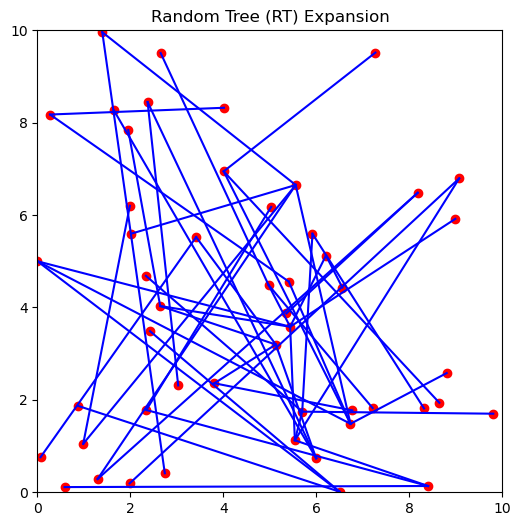

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class Tree:
    def __init__(self, start):
        self.nodes = [start]  # List of nodes (points)
        self.edges = []  # Connections between nodes

    def add_node(self, new_point, parent_point):
        self.nodes.append(new_point)
        self.edges.append((parent_point, new_point))

    def nearest_node(self, point):
        """Find the nearest node in the tree to the given point"""
        pass

def generate_random_point(bounds):
    """Generate a random point within given bounds"""
    return (np.random.uniform(bounds[0], bounds[1]), np.random.uniform(bounds[2], bounds[3]))

def grow_tree_RT(tree, bounds):
    """Random Tree (RT) Expansion: Connects a new point to a random existing node"""
    new_point = generate_random_point(bounds)
    parent_point = tree.nodes[np.random.randint(len(tree.nodes))]  # Choose a random existing node
    tree.add_node(new_point, parent_point)

def grow_tree_RRT(tree, bounds):
    """Rapidly-exploring Random Tree (RRT) Expansion: Connects a new point to the nearest node"""
    pass

def plot_tree(tree, title):
    """Plot the tree structure"""
    plt.figure(figsize=(6,6))
    for edge in tree.edges:
        plt.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], 'b-')
    plt.scatter(*zip(*tree.nodes), c='red', marker='o')
    plt.title(title)
    plt.xlim(0, 10)
    plt.ylim(0, 10)
    plt.show()

# Initialize trees
start_position = (0, 5)
rt_tree = Tree(start_position)
rrt_tree = Tree(start_position)

# Grow trees
num_of_tries = 50
for _ in range(num_of_tries):
    grow_tree_RT(rt_tree, (0, 10, 0, 10))
    #grow_tree_RRT(rrt_tree, (0, 10, 0, 10))

# Plot results
plot_tree(rt_tree, "Random Tree (RT) Expansion")
# plot_tree(rrt_tree, "Rapidly-exploring Random Tree (RRT) Expansion")

Here is a reference implementation of RRT

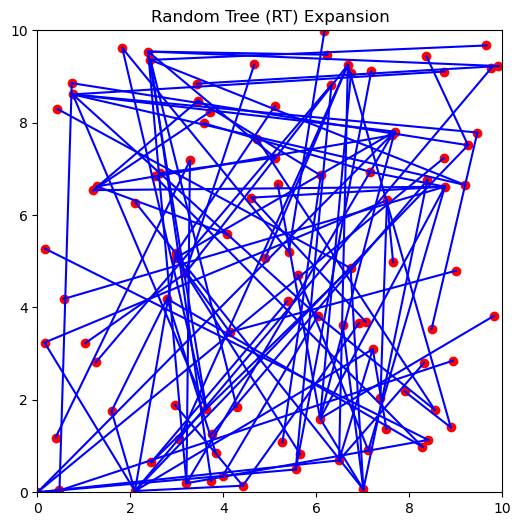

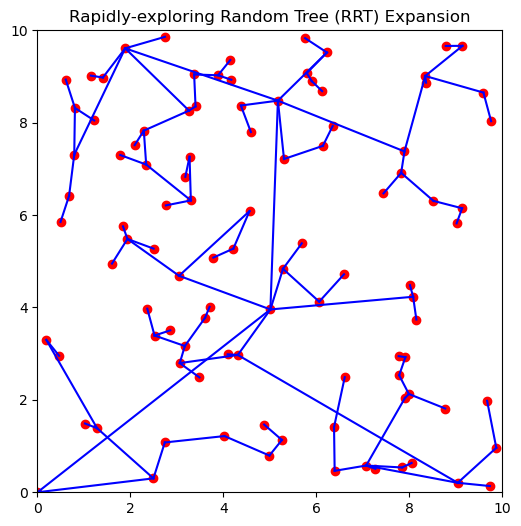

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class Tree:
    def __init__(self, start):
        self.nodes = [start]  # List of nodes (points)
        self.edges = []  # Connections between nodes

    def add_node(self, new_point, parent_point):
        self.nodes.append(new_point)
        self.edges.append((parent_point, new_point))

    def nearest_node(self, point):
        """Find the nearest node in the tree to the given point"""
        return min(self.nodes, key=lambda n: np.linalg.norm(np.array(n) - np.array(point)))

def generate_random_point(bounds):
    """Generate a random point within given bounds"""
    return (np.random.uniform(bounds[0], bounds[1]), np.random.uniform(bounds[2], bounds[3]))

def grow_tree_RT(tree, bounds):
    """Random Tree (RT) Expansion: Connects a new point to a random existing node"""
    new_point = generate_random_point(bounds)
    parent_point = tree.nodes[np.random.randint(len(tree.nodes))]  # Choose a random existing node
    tree.add_node(new_point, parent_point)

def grow_tree_RRT(tree, bounds):
    """Rapidly-exploring Random Tree (RRT) Expansion: Connects a new point to the nearest node"""
    new_point = generate_random_point(bounds)
    parent_point = tree.nearest_node(new_point)  # Find the nearest node
    tree.add_node(new_point, parent_point)

def plot_tree(tree, title):
    """Plot the tree structure"""
    plt.figure(figsize=(6,6))
    for edge in tree.edges:
        plt.plot([edge[0][0], edge[1][0]], [edge[0][1], edge[1][1]], 'b-')
    plt.scatter(*zip(*tree.nodes), c='red', marker='o')
    plt.title(title)
    plt.xlim(0, 10)
    plt.ylim(0, 10)
    plt.show()

# Initialize trees
start_position = (0, 0)
rt_tree = Tree(start_position)
rrt_tree = Tree(start_position)

# Grow trees
for _ in range(100):
    grow_tree_RT(rt_tree, (0, 10, 0, 10))
    grow_tree_RRT(rrt_tree, (0, 10, 0, 10))

# Plot results
plot_tree(rt_tree, "Random Tree (RT) Expansion")
plot_tree(rrt_tree, "Rapidly-exploring Random Tree (RRT) Expansion")

### Challenge for Extra Credit (3 pts in overall grade)

1. Add obstacles
  - Use something like this to define the obstacles (start and goal position are also defined)
```python
# Define environment
start_position = (1, 1)
goal = (9, 9)
obstacles = [(3, 3, 2, 2), (6, 6, 2, 2), (2, 7, 2, 1)]  # (x, y, width, height)
```
  - Need additional logic to check if the path has collisions with the obstacles
2. Implement RRT*
3. Show in animation the progress of the pathfinding process of RRT* in an environment with obstacles
  - Animation means when the code is running, the graph shows every new node added to the tree step by step, instead of the graph shows all the nodes added at the end of the process.

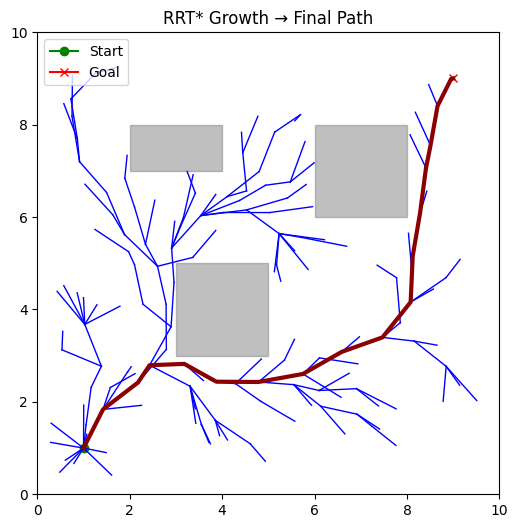

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

X_LIMITS = (0.0, 10.0)
Y_LIMITS = (0.0, 10.0)
START = (1.0, 1.0)
GOAL = (9.0, 9.0)
OBSTACLES = [
    (3.0, 3.0, 2.0, 2.0),
    (6.0, 6.0, 2.0, 2.0),
    (2.0, 7.0, 2.0, 1.0),
]
MAX_ITERS = 1500
STEP = 0.5
NEIGHBOR_R = 1.0
GOAL_BIAS = 0.05
COLLISION_D = 0.05

def euclid(a, b):
    return np.hypot(a[0] - b[0], a[1] - b[1])

def interpolate(p, q, max_step):
    vec = np.array(q) - np.array(p)
    dist = np.linalg.norm(vec)
    if dist < 1e-6:
        return p
    step = min(dist, max_step)
    return tuple(np.array(p) + vec/dist * step)

def segment_blocked(a, b):
    n = max(int(euclid(a, b) / COLLISION_D), 2)
    xs = np.linspace(a[0], b[0], n)
    ys = np.linspace(a[1], b[1], n)
    for ox, oy, w, h in OBSTACLES:
        inside = (ox <= xs) & (xs <= ox + w) & (oy <= ys) & (ys <= oy + h)
        if np.any(inside):
            return True
    return False

def rrt_star():
    nodes = [START]
    parent = {START: None}
    cost = {START: 0.0}
    events = []
    reached = False

    for _ in range(MAX_ITERS):
        if np.random.rand() < GOAL_BIAS:
            sample = GOAL
        else:
            sample = (
                np.random.uniform(*X_LIMITS),
                np.random.uniform(*Y_LIMITS)
            )

        nearest = min(nodes, key=lambda u: euclid(u, sample))
        new_pt = interpolate(nearest, sample, STEP)
        if segment_blocked(nearest, new_pt):
            continue

        neighs = [u for u in nodes if euclid(u, new_pt) <= NEIGHBOR_R]
        best_p, best_c = nearest, cost[nearest] + euclid(nearest, new_pt)
        for u in neighs:
            c_try = cost[u] + euclid(u, new_pt)
            if c_try < best_c and not segment_blocked(u, new_pt):
                best_p, best_c = u, c_try

        nodes.append(new_pt)
        parent[new_pt], cost[new_pt] = best_p, best_c
        events.append(((best_p, new_pt), "add"))

        for u in neighs:
            c_new = cost[new_pt] + euclid(new_pt, u)
            if c_new + 1e-6 < cost[u] and not segment_blocked(new_pt, u):
                events.append(((parent[u], u), "rem"))
                parent[u], cost[u] = new_pt, c_new
                events.append(((new_pt, u), "add"))

        if euclid(new_pt, GOAL) <= STEP and not segment_blocked(new_pt, GOAL):
            parent[GOAL] = new_pt
            cost[GOAL] = cost[new_pt] + euclid(new_pt, GOAL)
            events.append(((new_pt, GOAL), "add"))
            reached = True
            break

    path = []
    if reached:
        cur = GOAL
        while cur is not None:
            path.append(cur)
            cur = parent[cur]
        path.reverse()

    return events, path

events, path = rrt_star()
fig, ax = plt.subplots(figsize=(6,6))
ax.set_xlim(*X_LIMITS)
ax.set_ylim(*Y_LIMITS)
ax.set_aspect('equal', 'box')
ax.set_title("RRT* Growth → Final Path")

for ox, oy, w, h in OBSTACLES:
    ax.add_patch(plt.Rectangle((ox,oy), w, h, color='gray', alpha=0.5))

ax.plot(*START, marker='o', color='green', label="Start")
ax.plot(*GOAL, marker='x', color='red', label="Goal")
ax.legend(loc='upper left')

edge_art = {}
final_frame = len(events) - 1

def init():
    return []

def update(i):
    (p, q), act = events[i]
    artists = []
    if act == "add":
        ln, = ax.plot([p[0],q[0]], [p[1],q[1]], linewidth=1.0, color='blue')
        edge_art[(p,q)] = ln
        artists.append(ln)
    else:
        ln = edge_art.get((p,q))
        if ln:
            ln.set_visible(False)
            artists.append(ln)
    if i == final_frame and path:
        xs, ys = zip(*path)
        ln2, = ax.plot(xs, ys, linewidth=3, color='darkred')
        artists.append(ln2)
    return artists

ani = FuncAnimation(
    fig, update,
    frames=len(events),
    init_func=init,
    blit=True,
    interval=30,
    repeat=False
)

HTML(ani.to_jshtml())
